# Olympic Data Analysis and Prediction

DataSet Link: https://www.kaggle.com/datasets/heesoo37/120-years-of-olympic-history-athletes-and-results

Analyzing data relating to the Olympic Games is part of database likely contains data on individuals, events, nations, and medals earned during different Olympic Games editions.
- Medal Tally
- Overall Analysis
- Country_wise
- Athletes Analysis

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [2]:
df1 = pd.read_csv('athlete_events.csv')
df2 = pd.read_csv('noc_regions.csv')

In [3]:
df1.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NaN


In [4]:
df1.shape

(271116, 15)

In [5]:
df1 = df1[df1['Season'] == 'Summer']
df1.shape

(222552, 15)

In [6]:
df1.tail()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
271106,135565,Fernando scar Zylberberg,M,27.0,168.0,76.0,Argentina,ARG,2004 Summer,2004,Summer,Athina,Hockey,Hockey Men's Hockey,NaN
271107,135566,"James Francis ""Jim"" Zylker",M,21.0,175.0,75.0,United States,USA,1972 Summer,1972,Summer,Munich,Football,Football Men's Football,NaN
271108,135567,Aleksandr Viktorovich Zyuzin,M,24.0,183.0,72.0,Russia,RUS,2000 Summer,2000,Summer,Sydney,Rowing,Rowing Men's Lightweight Coxless Fours,NaN
271109,135567,Aleksandr Viktorovich Zyuzin,M,28.0,183.0,72.0,Russia,RUS,2004 Summer,2004,Summer,Athina,Rowing,Rowing Men's Lightweight Coxless Fours,NaN
271110,135568,Olga Igorevna Zyuzkova,F,33.0,171.0,69.0,Belarus,BLR,2016 Summer,2016,Summer,Rio de Janeiro,Basketball,Basketball Women's Basketball,NaN


In [7]:
df2.head()

,NOC,region,notes
0,AFG,Afghanistan,NaN
1,AHO,Curacao,Netherlands Antilles
2,ALB,Albania,NaN
3,ALG,Algeria,NaN
4,AND,Andorra,NaN


In [8]:
df2.tail()

,NOC,region,notes
225,YEM,Yemen,NaN
226,YMD,Yemen,South Yemen
227,YUG,Serbia,Yugoslavia
228,ZAM,Zambia,NaN
229,ZIM,Zimbabwe,NaN


In [9]:
df2.shape

(230, 3)

In [10]:
df = df1.merge(df2, on = 'NOC', how = 'left')
df.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN,China,NaN
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN,China,NaN
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN,Denmark,NaN
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold,Denmark,NaN
4,8,"Cornelia ""Cor"" Aalten (-Strannood)",F,18.0,168.0,NaN,Netherlands,NED,1932 Summer,1932,Summer,Los Angeles,Athletics,Athletics Women's 100 metres,NaN,Netherlands,NaN


Merged two DataFrames, df1 and df2, based on the 'NOC' column using a left join, resulting in a new DataFrame named df

In [11]:
df.shape

(222552, 17)

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 222552 entries, 0 to 222551
Data columns (total 17 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   ID      222552 non-null  int64  
 1   Name    222552 non-null  object 
 2   Sex     222552 non-null  object 
 3   Age     213363 non-null  float64
 4   Height  170695 non-null  float64
 5   Weight  168698 non-null  float64
 6   Team    222552 non-null  object 
 7   NOC     222552 non-null  object 
 8   Games   222552 non-null  object 
 9   Year    222552 non-null  int64  
 10  Season  222552 non-null  object 
 11  City    222552 non-null  object 
 12  Sport   222552 non-null  object 
 13  Event   222552 non-null  object 
 14  Medal   34088 non-null   object 
 15  region  222182 non-null  object 
 16  notes   4401 non-null    object 
dtypes: float64(3), int64(2), object(12)
memory usage: 30.6+ MB


In [13]:
df.describe()

,ID,Age,Height,Weight,Year
count,222552.000000,213363.000000,170695.000000,168698.00000,222552.000000
mean,67998.925712,25.674053,175.515551,70.68906,1976.317094
std,39139.038228,6.699839,10.914725,14.80394,30.942802
min,1.000000,10.000000,127.000000,25.00000,1896.000000
25%,34000.750000,21.000000,168.000000,60.00000,1956.000000
50%,68302.500000,24.000000,175.000000,70.00000,1984.000000
75%,101881.000000,28.000000,183.000000,79.00000,2000.000000
max,135568.000000,97.000000,226.000000,214.00000,2016.000000


In [14]:
df.isnull().sum()

ID             0
Name           0
Sex            0
Age         9189
Height     51857
Weight     53854
Team           0
NOC            0
Games          0
Year           0
Season         0
City           0
Sport          0
Event          0
Medal     188464
region       370
notes     218151
dtype: int64

In [15]:
df.duplicated().sum()

1385

There are 1385 duplicate rows in the DataFrame.

In [16]:
df.drop_duplicates(inplace = True)
df.duplicated().sum()

0

There are no more duplicate rows in the DataFrame after dropping them.

In [17]:
df['Medal'].value_counts()

Gold      11456
Bronze    11409
Silver    11212
Name: Medal, dtype: int64

The count of each unique value in the 'Medal' column of the DataFrame df.

In [18]:
df = pd.concat([df,pd.get_dummies(df['Medal'])],axis = 1)
df.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes,Bronze,Gold,Silver
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN,China,NaN,0,0,0
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN,China,NaN,0,0,0
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN,Denmark,NaN,0,0,0
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold,Denmark,NaN,0,1,0
4,8,"Cornelia ""Cor"" Aalten (-Strannood)",F,18.0,168.0,NaN,Netherlands,NED,1932 Summer,1932,Summer,Los Angeles,Athletics,Athletics Women's 100 metres,NaN,Netherlands,NaN,0,0,0


The DataFrame df after one-hot encoding the 'Medal' column and concatenating the resulting dummy variables.

In [19]:
df.groupby('NOC').sum()[['Gold','Silver','Bronze']].sort_values('Gold',ascending = False).reset_index()

,NOC,Gold,Silver,Bronze
0,USA,2472.0,1333.0,1197.0
1,URS,832.0,635.0,596.0
2,GBR,635.0,729.0,620.0
3,GER,592.0,538.0,649.0
4,ITA,518.0,474.0,454.0
...,...,...,...,...
225,AHO,0.0,1.0,0.0
226,LBR,0.0,0.0,0.0
227,LCA,0.0,0.0,0.0
228,LES,0.0,0.0,0.0


Total count of Gold, Silver, and Bronze medals for each National Olympic Committee (NOC), sorted by the number of Gold medals in descending order.

In [20]:
df_New = df.drop_duplicates(subset = ['Team','NOC','Games','Year','Season','City','Sport','Event','Medal'])
df_New = df_New.groupby('NOC').sum()[['Gold','Silver','Bronze']].sort_values('Gold',ascending = False).reset_index()
df_New[df_New['NOC']== 'USA']

,NOC,Gold,Silver,Bronze
0,USA,1035.0,802.0,708.0


The DataFrame df_New has been created by removing duplicate rows based on certain columns and then aggregating the medal counts for each country. The resulting DataFrame is sorted by the number of Gold medals in descending order. The code snippet provided further filters the DataFrame to show the medal counts for the USA.

In [21]:
df_New['Total'] = df_New['Gold'] + df_New['Silver'] + df_New['Bronze']
df_New.head()

,NOC,Gold,Silver,Bronze,Total
0,USA,1035.0,802.0,708.0,2545.0
1,URS,394.0,317.0,294.0,1005.0
2,GBR,278.0,317.0,300.0,895.0
3,GER,235.0,261.0,283.0,779.0
4,FRA,234.0,256.0,287.0,777.0


In [22]:
df['region'].value_counts().head()

USA        14815
Germany    12281
UK         10776
France     10426
Russia      8855
Name: region, dtype: int64

In [23]:
df_medal = df.drop_duplicates(subset = ['Team','NOC','Games','Year','Season','City','Sport','Event','Medal'])
df_medal.head(3)

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes,Bronze,Gold,Silver
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN,China,NaN,0,0,0
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN,China,NaN,0,0,0
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN,Denmark,NaN,0,0,0


In [24]:
def medal_tally(year , country):
    df_medal = df.drop_duplicates(subset = ['Team','NOC','Games','Year','Season','City','Sport','Event','Medal'])
    flag = 0
    if year == 'Overall' and country == 'Overall':
        temp_df = df_medal
    if year == 'Overall' and country != 'Overall':
        flag == 1
        temp_df = df_medal[df_medal['NOC']== country]
    if year != 'Overall' and country == 'Overall':
        temp_df = df_medal[df_medal['Year']== int(year)]
    if year != 'Overall' and country != 'Overall':
        temp_df = df_medal[(df_medal['Year'] == int(year)) & (df_medal['NOC'] == country)]
    if flag == 1:    
        Y = temp_df.groupby('NOC').sum()[['Gold','Silver','Bronze']].sort_values('Year').reset_index()
    else:
        Y = temp_df.groupby('NOC').sum()[['Gold','Silver','Bronze']].sort_values('Gold',ascending = False).reset_index()

    Y['Total'] = Y['Gold'] + Y['Silver'] + Y['Bronze']
    
    print(Y)   

In [25]:
medal_tally(year = 'Overall' , country = 'IND')

   NOC  Gold  Silver  Bronze  Total
0  IND     9       7      12     28


A function medal_tally that takes a year and country as parameters and prints the medal tally for the specified conditions. If 'Overall' is selected for either year or country, it considers all years or countries, respectively. The function calculates the total count of Gold, Silver, and Bronze medals for each National Olympic Committee (NOC) and prints the result, sorted by the number of Gold medals in descending order. The 'Total' column represents the overall medal count.

# OVERALL ANALYSIS
 - Number of Editions
 - Number of Cities
 - Number of Events&sports
 - Number of Athletes
 - Participation Nation

In [26]:
df.head(2)

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes,Bronze,Gold,Silver
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN,China,NaN,0,0,0
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN,China,NaN,0,0,0


In [27]:
df['Year'].unique().shape[0]-1

28

In [28]:
df['City'].unique().shape[0]

23

In [29]:
df['Sport'].unique().shape[0]

52

In [30]:
df['Event'].unique().shape[0]

651

In [31]:
df['Name'].unique().shape[0]

116122

In [32]:
df['region'].unique().shape[0]

206

In [33]:
df.head(2)

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes,Bronze,Gold,Silver
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN,China,NaN,0,0,0
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN,China,NaN,0,0,0


In [34]:
df_nat = df.drop_duplicates(['Year','Season'])['Year'].value_counts().reset_index()
df_nat.rename(columns={'index':'Year','Year':'Countries' },inplace = True)
df_nat

,Year,Countries
0,1992,1
1,1968,1
2,1908,1
3,1904,1
4,1906,1
5,1964,1
6,1980,1
7,1976,1
8,1928,1
9,1960,1


The variable df_nat is a DataFrame that contains the count of unique countries participating in each year of the Olympic Games. The DataFrame has two columns: 'Year' and 'Countries'. The data has been sorted based on the 'Year' column in ascending order.

In [35]:
print(df.columns)

Index(['ID', 'Name', 'Sex', 'Age', 'Height', 'Weight', 'Team', 'NOC', 'Games',
       'Year', 'Season', 'City', 'Sport', 'Event', 'Medal', 'region', 'notes',
       'Bronze', 'Gold', 'Silver'],
      dtype='object')


In [36]:
fig = px.line(df_nat , x = 'Year' , y = 'Countries')
fig.show()

This code creates a line plot using Plotly Express (px) to visualize the count of unique countries participating in each year of the Olympic Games. The x-axis represents the years, and the y-axis represents the number of countries. The fig.show() command is used to display the plot.

In [37]:
df_xx = df.drop_duplicates(['Year','Age','Medal'])
fig = px.scatter(df_xx, x='Year', y='Age',title='Olympic Data Visualization', color='Sport'
                     ,hover_data=['Name', 'Team', 'Medal'])
fig.show()

The code utilizes Plotly Express to generate a scatter plot, depicting the correlation between athletes' age and the corresponding Olympic Games year. Each data point signifies a distinct combination of year, age, and medal status, with color-coded representation based on the sport. Hovering over points reveals detailed information about the athlete, team, and medal status. The final fig.show() command displays the interactive plot.

<AxesSubplot:xlabel='Year', ylabel='Sport'>

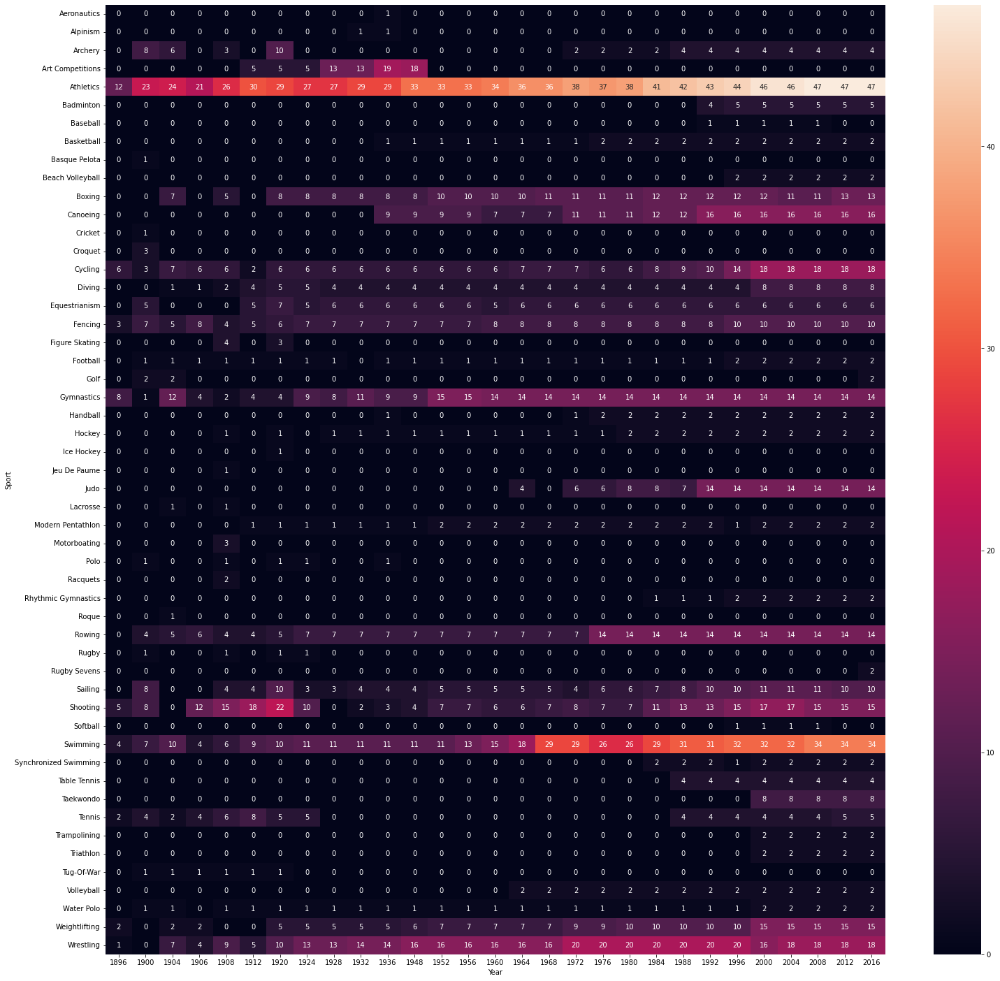

In [38]:
df_x = df.drop_duplicates(['Year','Sport','Event'])
plt.figure(figsize=(25,25))
sns.heatmap(df_x.pivot_table(index ='Sport',columns='Year',values='Event',aggfunc ='count').fillna(0).astype('int'),annot=True)

The code creates a heatmap using Seaborn and Matplotlib to visualize the count of unique events across different sports and years in the Olympic dataset. The heatmap is based on a pivot table that aggregates the event counts for each sport and year combination. The plt.figure(figsize=(25,25)) sets the size of the heatmap, and sns.heatmap generates the plot. The annotations (annot=True) display the counts on the heatmap.

In [39]:
def successful (df,sport):
    temp_df = df.dropna(subset = ['Medal'])
    
    if sport != 'Overall':
        temp_df = temp_df[temp_df['Sport'] == sport]
    df_x1 = temp_df['Name'].value_counts().reset_index().head(20).merge(df,left_on = 'index',right_on = 'Name', how = 'left')[['index','Name_x','Sport','region']].drop_duplicates('index').head(20)
    df_x1.rename(columns={'index':'Name_x','Name_x':'Medal'},inplace =True) 
    return df_x1

In [40]:
successful(df,'Overall').head(20)

,Name_x,Medal,Sport,region
0,"Michael Fred Phelps, II",28,Swimming,USA
30,Larysa Semenivna Latynina (Diriy-),18,Gymnastics,Russia
49,Nikolay Yefimovich Andrianov,15,Gymnastics,Russia
73,Borys Anfiyanovych Shakhlin,13,Gymnastics,Russia
97,Takashi Ono,13,Gymnastics,Japan
130,Edoardo Mangiarotti,13,Fencing,Italy
144,"Dara Grace Torres (-Hoffman, -Minas)",12,Swimming,USA
157,Aleksey Yuryevich Nemov,12,Gymnastics,Russia
178,"Jennifer Elisabeth ""Jenny"" Thompson (-Cumpelik)",12,Swimming,USA
195,Birgit Fischer-Schmidt,12,Canoeing,Germany


This function filters the dataset to include only rows where athletes have won a medal. If a specific sport is provided, it further filters the dataset to include only that sport. Then, it counts the occurrences of each athlete's name, selects the top 20 athletes with the most medals, and merges the result with the original dataset to extract relevant columns. The final output is a DataFrame showing the top 20 successful athletes, including their names, medal counts, sports, and regions.

## Country Wise
- Country wise medal per year
- Most Successful Athletes

In [41]:
temp_df = df.dropna(subset = ['Medal'])
temp_df.drop_duplicates(subset = ['Team','NOC','Games','Year','Season','City','Sport','Event','Medal'],inplace = True)

C:\Users\ravir\AppData\Local\Temp\ipykernel_6312\1132156524.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [42]:
temp = temp_df[temp_df['region'] == 'USA']
df_final=temp.groupby('Year').count()['Medal'].reset_index()

In [43]:
fig = px.line(df_final, x = 'Year' , y = 'Medal')
fig.show()

This code uses Plotly Express (px) to create a line plot visualizing the distribution of medals over the years. The x-axis represents the years, and the y-axis represents the count of medals. 

<AxesSubplot:xlabel='Year', ylabel='Sport'>

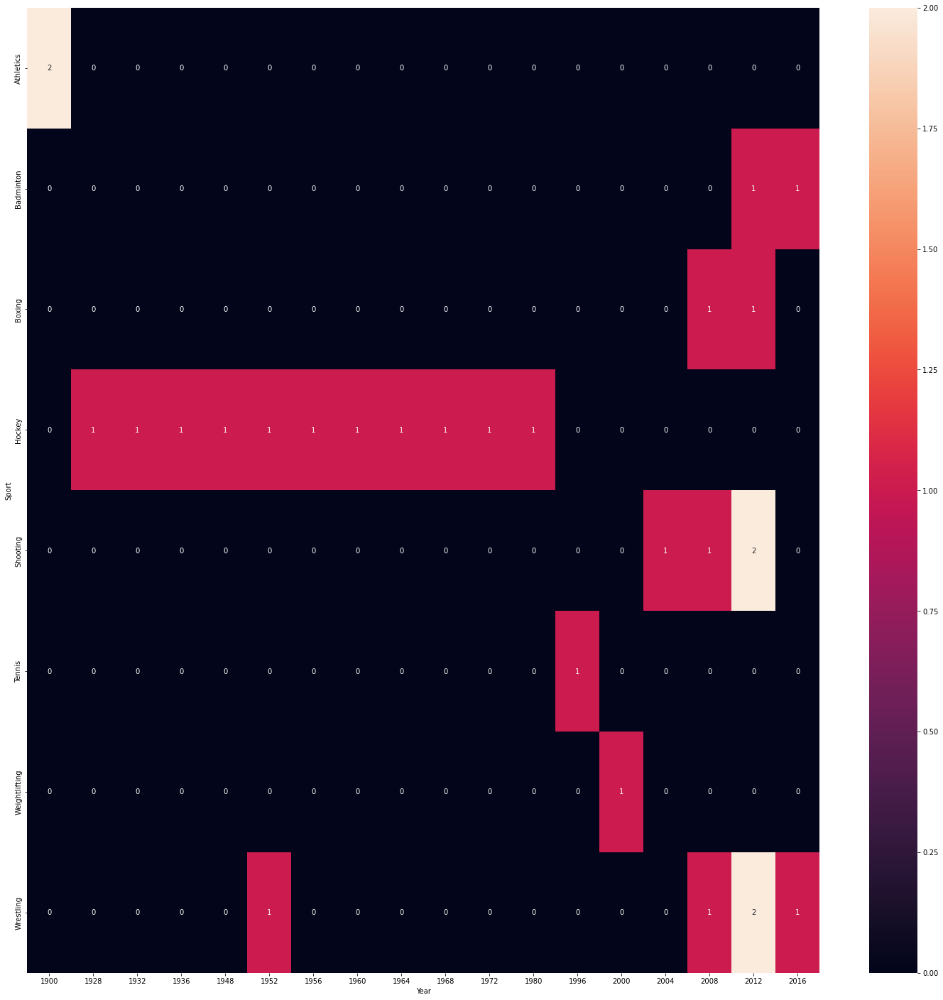

In [44]:
temp = temp_df[temp_df['region'] == 'India']
plt.figure(figsize = (25,25))
sns.heatmap(temp.pivot_table(index = 'Sport',columns = 'Year' , values = 'Medal',aggfunc = 'count').fillna(0),annot = True)

This code generates a heatmap using seaborn to visualize the distribution of medals for India across different sports and years. Each cell in the heatmap represents the count of medals for a specific sport in a particular year. The plt.figure(figsize=(25, 25)) command is used to set the size of the heatmap, and sns.heatmap() is used to create the heatmap with annotations. The filtering is done to select only the rows where the region is 'India'.

In [45]:
def most_successful (df,country):
    temp_df = df.dropna(subset = ['Medal'])
    temp_df = temp_df[temp_df['NOC'] == country]
    df_x1 = temp_df['Name'].value_counts().reset_index().head(20).merge(df,left_on = 'index',right_on = 'Name', how = 'left')[['index','Name_x','Sport']].drop_duplicates('index').head(20)
    df_x1.rename(columns={'index':'Name_x','Name_x':'Medal'},inplace =True) 
    return df_x1

In [46]:
most_successful(df, 'IND')

,Name_x,Medal,Sport
0,Udham Singh Kular,4,Hockey
4,Leslie Walter Claudius,4,Hockey
8,Shankar Pillay Laxman,3,Hockey
11,Ranganathan Francis,3,Hockey
14,Richard James Allen,3,Hockey
17,Balbir Singh,3,Hockey
20,Harbinder Singh Chimni,3,Hockey
23,"Balbir Singh Dosanjh, Sr.",3,Hockey
26,"Victor John ""V. J."" Peter",3,Hockey
29,Dhyan Chand Bais,3,Hockey


The function most_successful is designed to extract and showcase the top 20 most successful athletes from a given country, emphasizing the count of medals they have won. By filtering out rows with missing medal information and narrowing down the DataFrame to the specified country, the function identifies and ranks athletes based on their medal counts. The resulting DataFrame includes columns such as 'Name_x' for the athlete's name and 'Sport,' offering a concise representation of the top-performing athletes from the selected country.

## Athletes Wise

In [47]:
import plotly.figure_factory as ff

In [48]:
df_athlets = df.drop_duplicates(subset =['Name','NOC'])

In [49]:
df_1 = df_athlets['Age'].dropna()
df_2 = df_athlets[df_athlets['Medal'] == "Gold"]['Age'].dropna()
df_3 = df_athlets[df_athlets['Medal'] == "Silver"]['Age'].dropna()
df_4 = df_athlets[df_athlets['Medal'] == "Bronze"]['Age'].dropna()


This code creates four separate DataFrames (df_1, df_2, df_3, df_4) to analyze the distribution of ages among athletes. The first DataFrame (df_1) includes all athletes' ages with non-null values. The subsequent DataFrames (df_2, df_3, df_4) focus on athletes who won Gold, Silver, and Bronze medals, respectively, filtering out rows with missing age information for each medal type.

In [50]:
fig = ff.create_distplot([df_1,df_2,df_3,df_4],["Age Distribution","Gold Medal","Silver Medal","Bronze Medal"],show_hist = False ,show_rug = False)
fig.show()

This code uses the create_distplot function from the plotly.figure_factory module to generate a distribution plot for the age distribution of athletes and separate distributions for Gold, Silver, and Bronze medalists. The show_hist and show_rug parameters are set to False to exclude the histogram and rug plot components, respectively. The resulting figure provides an overview of the age distribution among all athletes and the distribution among athletes who won Gold, Silver, and Bronze medals.

In [51]:
df_athlets['Medal'].fillna('No Medal', inplace = True)

D:\anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='Weight', ylabel='Height'>

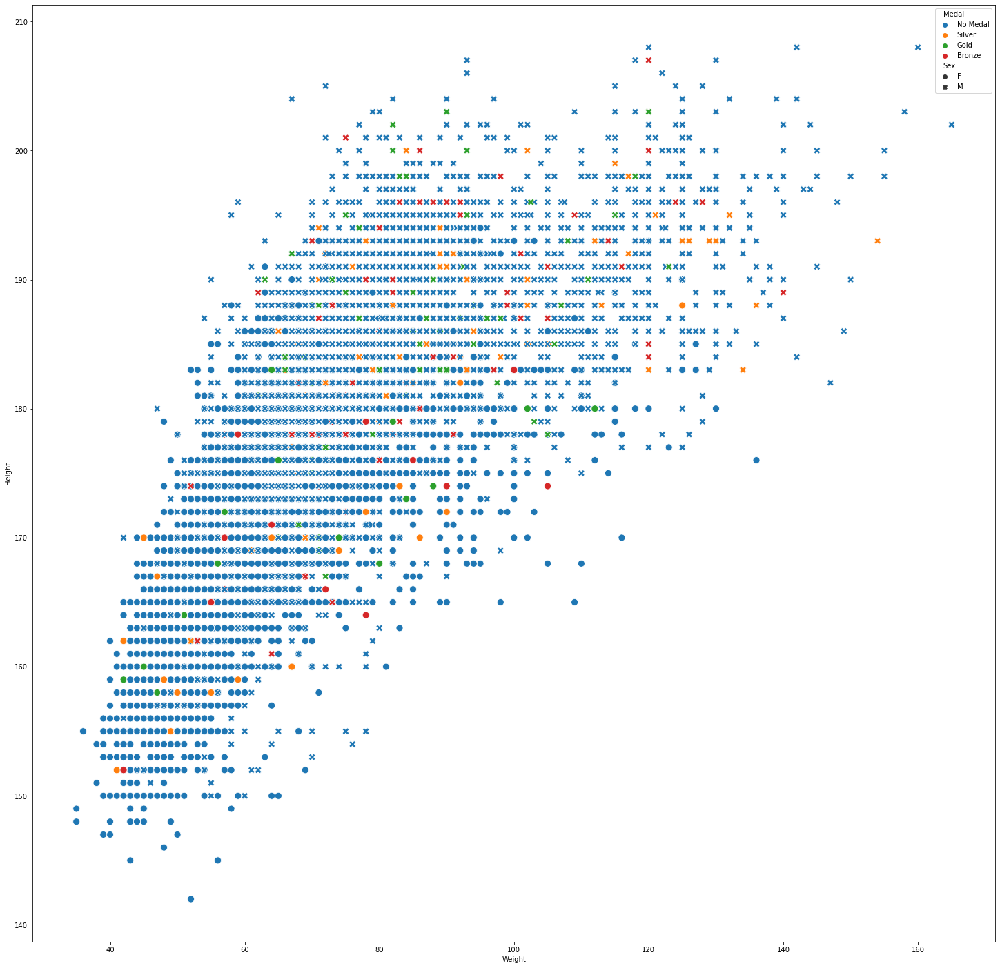

In [52]:
plt.figure(figsize = (25,25))
temp_df = df_athlets[df_athlets['Sport']=='Athletics']
sns.scatterplot(temp_df['Weight'],temp_df['Height'],hue = temp_df['Medal'],style = temp_df['Sex'],s = 100)


This code creates a scatter plot using the seaborn library to visualize the relationship between the weight and height of athletes in the sport of Athletics. The points on the scatter plot are colored based on the medal won, and different symbols represent athletes of different genders. The s parameter is set to 100 to adjust the size of the markers in the plot. The resulting plot provides insights into the distribution of weight and height among athletes in Athletics, with distinctions based on gender and medal status.

In [53]:
df_men = df_athlets[df_athlets['Sex'] == 'M'].groupby('Year').count()['Name'].reset_index()
df_women = df_athlets[df_athlets['Sex'] == 'F'].groupby('Year').count()['Name'].reset_index()

In [54]:
df_final = df_men.merge(df_women , on = 'Year',how = 'left')
df_final.rename(columns={'Name_x':'Male','Name_y':'Female'},inplace = True)
df_final.fillna(0 , inplace = True)

In [55]:
fig = px.line(df_final , x = 'Year' , y =['Male','Female'])
fig.show()

This line plot provides a visual representation of the changing participation trends in male and female athletes over the years, offering insights into the dynamics of gender representation in the Olympics.

In [56]:
df_cleaned = df.dropna(subset=['Medal', 'Year'])

fig = px.histogram(df_cleaned, x='Year', color='Medal', title='Medal Distribution Over Time',
                   labels={'Year': 'Year', 'Medal': 'Medal'},
                   category_orders={'Medal': ['Gold', 'Silver', 'Bronze']},
                   histfunc='count', barmode='overlay')

fig.update_layout(xaxis=dict(type='category'))
fig.update_xaxes(tickangle=90)

fig.show()



This Plotly Express histogram visualizes the distribution of Olympic medals over time, highlighting the counts of Gold, Silver, and Bronze medals in each year.

In [57]:
df_x11 = df.dropna(subset =['Sex','Height'])
fig = px.box(df, x='Sex', y='Height', title='Distribution of Athlete Heights by Sex',
             labels={'Sex': 'Sex', 'Height': 'Height'})

fig.show()

This Plotly Express box plot illustrates the distribution of athlete heights categorized by gender (Sex). The plot provides insights into the spread and central tendency of height values for male and female athletes

In [58]:
# Medal distribution by sport
sport_medals = df[df['Medal'].notnull()]['Sport'].value_counts().head(10)

fig = px.bar(x=sport_medals.values, y=sport_medals.index,
             labels={'x': 'Medal Count', 'y': 'Sport'},
             title='Medal Distribution by Sport')

fig.show()

This Plotly Express bar plot visualizes the medal distribution among the top 10 sports. Each bar represents the count of medals in a specific sport

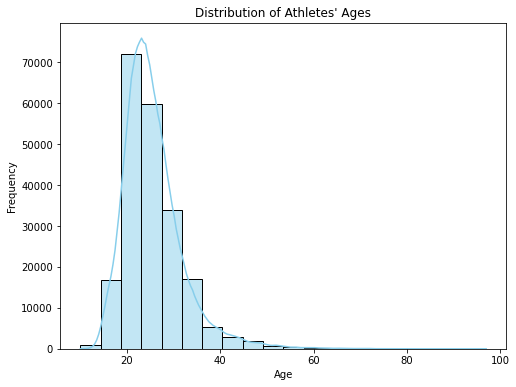

In [59]:
# Histogram of athletes' ages
plt.figure(figsize=(8, 6))
sns.histplot(df['Age'], bins=20, kde=True, color='skyblue')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.title('Distribution of Athletes\' Ages')
plt.show()

This seaborn histogram visualizes the distribution of athletes' ages. The plot shows the frequency of athletes in different age bins, with a kernel density estimate for a smoother representation of the distribution

In [60]:
gender_medals = df[df['Medal'].notnull()]['Sex'].value_counts()

fig = px.pie(gender_medals, names=gender_medals.index, values=gender_medals.values, title='Distribution of Medals by Gender')
fig.show()


This Plotly pie chart provides a clear visualization of the distribution of medals by gender. Each slice of the pie represents a gender category (Male or Female), and the size of each slice corresponds to the number of medals awarded to athletes of that gender. 

## MACHINE LEARNING MODELS

In [61]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import accuracy_score, classification_report
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import r2_score

In [62]:
df = df.dropna(subset=['Medal'])

In [63]:
# Select features (X) and target variable (y)
X = df.drop(['Medal'], axis=1)
y = df['Medal']

In [64]:
# Define numerical and categorical features
numeric_features = ['Age', 'Height', 'Weight', 'Year']
categorical_features = ['Sex', 'Season', 'Sport', 'Event']

In [65]:
# Create preprocessing pipeline
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median'))
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ])

In [66]:
# Create the full pipeline with preprocessing and the classifier
model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', RandomForestClassifier(random_state=42))
])

In [67]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [68]:
# Train the model using the pipeline
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")

# Display classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

Accuracy: 0.34066901408450706
Classification Report:
              precision    recall  f1-score   support

      Bronze       0.35      0.35      0.35      2277
        Gold       0.36      0.35      0.36      2301
      Silver       0.32      0.32      0.32      2238

    accuracy                           0.34      6816
   macro avg       0.34      0.34      0.34      6816
weighted avg       0.34      0.34      0.34      6816



## Random Forest Model

In [69]:
# Create the full pipeline with preprocessing and the Random Forest classifier
random_forest_model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', RandomForestClassifier(random_state=42))
])
# Train the Random Forest model using the pipeline
random_forest_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred_rf = random_forest_model.predict(X_test)

# Evaluate the Random Forest model
accuracy_rf = accuracy_score(y_test, y_pred_rf)
classification_rep_rf = classification_report(y_test, y_pred_rf)

# Display Random Forest model and evaluation metrics
print("\nRandom Forest Evaluation Metrics:")
print(f"Accuracy: {accuracy_rf}")
print("Classification Report:")
print(classification_rep_rf)


Random Forest Evaluation Metrics:
Accuracy: 0.34066901408450706
Classification Report:
              precision    recall  f1-score   support

      Bronze       0.35      0.35      0.35      2277
        Gold       0.36      0.35      0.36      2301
      Silver       0.32      0.32      0.32      2238

    accuracy                           0.34      6816
   macro avg       0.34      0.34      0.34      6816
weighted avg       0.34      0.34      0.34      6816



In [70]:
from sklearn.metrics import confusion_matrix

# Create a confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred_rf, labels=model.classes_)

# Convert the confusion matrix to a DataFrame for Plotly
conf_matrix_df = pd.DataFrame(conf_matrix, index=model.classes_, columns=model.classes_)

# Plot the confusion matrix as a heatmap
fig = px.imshow(conf_matrix_df, labels=dict(x="Predicted", y="Actual"), x=model.classes_, y=model.classes_,
                title="Confusion Matrix - Random Forest Model",
                color_continuous_scale="Viridis")

fig.show()

## Logistic Regression Model

In [71]:
# Create the full pipeline with preprocessing and the Logistic Regression classifier
logistic_regression_model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', LogisticRegression(random_state=42))
])

# Train the Logistic Regression model using the pipeline
logistic_regression_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred_lr = logistic_regression_model.predict(X_test)

# Evaluate the Logistic Regression model
accuracy_lr = accuracy_score(y_test, y_pred_lr)
classification_rep_lr = classification_report(y_test, y_pred_lr)

# Display Logistic Regression model and evaluation metrics
print("\nLogistic Regression Evaluation Metrics:")
print(f"Accuracy: {accuracy_lr}")
print("Classification Report:")
print(classification_rep_lr)


Logistic Regression Evaluation Metrics:
Accuracy: 0.3488849765258216
Classification Report:
              precision    recall  f1-score   support

      Bronze       0.35      0.45      0.39      2277
        Gold       0.37      0.39      0.38      2301
      Silver       0.31      0.21      0.25      2238

    accuracy                           0.35      6816
   macro avg       0.34      0.35      0.34      6816
weighted avg       0.34      0.35      0.34      6816



D:\anaconda\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



In [72]:
import plotly.graph_objects as go

# Get the classification report
classification_report_dict = classification_report(y_test, y_pred_lr, output_dict=True)

# Convert the classification report to a Pandas DataFrame for easier manipulation
classification_df = pd.DataFrame(classification_report_dict).transpose()

# Create a Plotly table from the DataFrame
fig = go.Figure(data=[go.Table(
    header=dict(values=classification_df.columns),
    cells=dict(values=[classification_df[col] for col in classification_df.columns]))
])

# Update the layout for better visibility
fig.update_layout(title="Logistic Regression Classification Report",
                  margin=dict(l=0, r=0, t=30, b=0))

# Show the Plotly table
fig.show()


## Decision Tree Model

In [73]:
# Create the full pipeline with preprocessing and the Decision Tree classifier
decision_tree_model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', DecisionTreeClassifier(random_state=42))
])

# Train the Decision Tree model using the pipeline
decision_tree_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred_dt = decision_tree_model.predict(X_test)

# Evaluate the Decision Tree model
accuracy_dt = accuracy_score(y_test, y_pred_dt)
classification_rep_dt = classification_report(y_test, y_pred_dt)

# Display Decision Tree model and evaluation metrics
print("\nDecision Tree Evaluation Metrics:")
print(f"Accuracy: {accuracy_dt}")
print("Classification Report:")
print(classification_rep_dt)


Decision Tree Evaluation Metrics:
Accuracy: 0.352406103286385
Classification Report:
              precision    recall  f1-score   support

      Bronze       0.36      0.37      0.36      2277
        Gold       0.37      0.37      0.37      2301
      Silver       0.33      0.32      0.32      2238

    accuracy                           0.35      6816
   macro avg       0.35      0.35      0.35      6816
weighted avg       0.35      0.35      0.35      6816



In [74]:
# Create a confusion matrix
conf_matrix_lr = confusion_matrix(y_test, y_pred_dt, labels=model.classes_)

# Convert the confusion matrix to a DataFrame for Plotly
conf_matrix_df_lr = pd.DataFrame(conf_matrix_lr, index=model.classes_, columns=model.classes_)

# Plot the confusion matrix as a heatmap
fig_lr = px.imshow(conf_matrix_df_lr, labels=dict(x="Predicted", y="Actual"), x=model.classes_, y=model.classes_,
                   title="Confusion Matrix - Logistic Regression Model",
                   color_continuous_scale="Viridis")

fig_lr.show()

## SVM Model

In [75]:
# Create the full pipeline with preprocessing and the Support Vector Machine classifier
svm_model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', SVC(random_state=42))
])

# Train the SVM model using the pipeline
svm_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred_svm = svm_model.predict(X_test)

# Evaluate the SVM model
accuracy_svm = accuracy_score(y_test, y_pred_svm)
classification_rep_svm = classification_report(y_test, y_pred_svm)

# Display SVM model and evaluation metrics

print("\nSupport Vector Machine (SVM) Evaluation Metrics:")
print(f"Accuracy: {accuracy_svm}")
print("Classification Report:")
print(classification_rep_svm)


Support Vector Machine (SVM) Evaluation Metrics:
Accuracy: 0.3444835680751174
Classification Report:
              precision    recall  f1-score   support

      Bronze       0.37      0.15      0.21      2277
        Gold       0.34      0.87      0.49      2301
      Silver       0.00      0.00      0.00      2238

    accuracy                           0.34      6816
   macro avg       0.24      0.34      0.23      6816
weighted avg       0.24      0.34      0.24      6816



D:\anaconda\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

D:\anaconda\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

D:\anaconda\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [76]:
import plotly.express as px
from sklearn.metrics import plot_confusion_matrix, roc_curve, auc
# Create confusion matrix figure
fig_cm = px.imshow(confusion_matrix(y_test, y_pred_svm), labels=dict(x="Predicted", y="Actual", color="Count"))
fig_cm.update_layout(title_text='Confusion Matrix - SVM Model', font_size=14)
fig_cm.show()

## KNN Model

In [77]:
# Create the full pipeline with preprocessing and the KNN classifier
knn_model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', KNeighborsClassifier())
])

# Train the KNN model using the pipeline
knn_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred_knn = knn_model.predict(X_test)

# Evaluate the KNN model
accuracy_knn = accuracy_score(y_test, y_pred_knn)
classification_rep_knn = classification_report(y_test, y_pred_knn)

# Display KNN model and evaluation metrics
print("\nK-Nearest Neighbors (KNN) Evaluation Metrics:")
print(f"Accuracy: {accuracy_knn}")
print("Classification Report:")
print(classification_rep_knn)


K-Nearest Neighbors (KNN) Evaluation Metrics:
Accuracy: 0.3559272300469484
Classification Report:
              precision    recall  f1-score   support

      Bronze       0.35      0.47      0.40      2277
        Gold       0.37      0.37      0.37      2301
      Silver       0.34      0.22      0.27      2238

    accuracy                           0.36      6816
   macro avg       0.35      0.36      0.35      6816
weighted avg       0.35      0.36      0.35      6816



In [78]:
# Confusion Matrix Heatmap for KNN
fig_cm_knn = px.imshow(confusion_matrix(y_test, y_pred_knn), labels=dict(x="Predicted", y="Actual", color="Count"))
fig_cm_knn.update_layout(title_text='Confusion Matrix - KNN Model', font_size=14)
fig_cm_knn.show()


In [79]:
import plotly.graph_objects as go

# Create subplots
fig = go.Figure()

# Add traces for each model
fig.add_trace(go.Table(
    header=dict(values=['Model', 'Accuracy', 'Classification Report']),
    cells=dict(values=[
        ['Random Forest', 'Logistic Regression', 'Decision Tree', 'SVM', 'KNN'],
        [accuracy_rf, accuracy_lr, accuracy_dt, accuracy_svm, accuracy_knn],
        [classification_rep_rf, classification_rep_lr, classification_rep_dt, classification_rep_svm, classification_rep_knn]
    ])
))

# Update layout
fig.update_layout(title_text='Model Evaluation Metrics', font_size=14)
fig.show()
